In [1]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import numpy as np
import os
import sys
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchgeometry as tgm

### Inputs

In [2]:
input_dir = '/data/depth/'
root_dir = os.path.join(input_dir, 'training')
sequence_name = 'alley_1'
frame_i_id = 2
frame_ref_id = 1
EPS = 1e-6
learning_rate = 1e-4
num_iterations = 50000  
log_interval = 1000  # print log every 200 iterations
use_cuda = torch.cuda.is_available()
device = torch.device('cuda' if use_cuda else 'cpu')
print('Using ', device)

Using  cuda


### Utility functions

In [3]:
def load_data(root_path, sequence_name, frame_id):
    # index paths                                                                                                                        
    file_name = 'frame_%04d' % (frame_id)
    image_file = os.path.join(root_path, 'clean', sequence_name,
                              file_name + '.png')
    depth_file = os.path.join(root_path, 'depth', sequence_name,
                              file_name + '.dpt')
    camera_file = os.path.join(root_path, 'camdata_left', sequence_name,
                               file_name + '.cam')
    # load the actual data                                                                                                               
    image_tensor = load_image(image_file)
    depth = load_depth(depth_file)
    # load camera data and create pinhole                                                                                                
    height, width = image_tensor.shape[-2:]
    intrinsics, extrinsics = load_camera_data(camera_file)
    camera = tgm.utils.create_pinhole(intrinsics, extrinsics, height, width)
    return image_tensor, depth, camera

def load_depth(file_name):
    """Loads the depth using the sintel SDK and converts to torch.Tensor                                                                 
    """
    assert os.path.isfile(file_name), "Invalid file {}".format(file_name)
    import sintel_io
    depth = sintel_io.depth_read(file_name)
    return torch.from_numpy(depth).view(1, 1, *depth.shape).float()

def load_camera_data(file_name):
    """Loads the camera data using the sintel SDK and converts to torch.Tensor.                                                          
    """
    assert os.path.isfile(file_name), "Invalid file {}".format(file_name)
    import sintel_io
    intrinsic, extrinsic = sintel_io.cam_read(file_name)
    return intrinsic, extrinsic

def load_image(file_name):
    """Loads the image with OpenCV and converts to torch.Tensor                                                                          
    """
    assert os.path.isfile(file_name), "Invalid file {}".format(file_name)

    # load image with OpenCV                                                                                                             
    img = cv2.imread(file_name, cv2.IMREAD_COLOR)

    # convert image to torch tensor                                                                                                      
    tensor = tgm.utils.image_to_tensor(img).float() / 255.
    return tensor.view(1, *tensor.shape)  # 1xCxHxW 

def clip_and_convert_tensor(tensor):
    """convert the input torch.Tensor to OpenCV image,clip it to be between
    [0, 255] and convert it to unit
    """
    img = tgm.utils.tensor_to_image(255. * tensor) # convert tensor to numpy
    img_cliped = np.clip(img, 0, 255)[:,:,::-1] # clip and reorder the channels
    img = img_cliped.astype('uint') # convert to uint
    return img

### Configure sintel SDK path

In [4]:
# configure sintel SDK path                                                                                                          
root_path = os.path.abspath(input_dir)
sys.path.append(os.path.join(root_path, 'sdk/python'))

### Load image, depth and camera 

In [5]:
img_ref, depth_ref, cam_ref = load_data(root_dir, sequence_name, frame_ref_id)
img_i, _, cam_i = load_data(root_dir, sequence_name, frame_i_id)

### Visualize the inputs

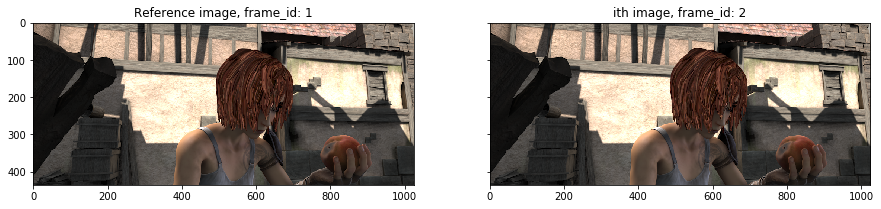

In [6]:
%matplotlib inline
fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
fig.set_figheight(15)
fig.set_figwidth(15)
ax1.imshow(tgm.utils.tensor_to_image(img_ref)[:,:,::-1])
ax1.set_title('Reference image, frame_id: %d' %frame_ref_id)
ax2.imshow(tgm.utils.tensor_to_image(img_i)[:,:,::-1])
ax2.set_title('ith image, frame_id: %d' %frame_i_id)
plt.show()

### Container to hold the homography as a trainable parameter

In [7]:
class MyDepth(nn.Module):
    def __init__(self, height, width):
        super(MyDepth, self).__init__()
        self.depth = nn.Parameter(torch.Tensor(1, height, width))
        self.reset_parameters()

    def reset_parameters(self):
        torch.nn.init.uniform_(self.depth)

    def forward(self):
        return torch.unsqueeze(self.depth, dim=0)  # 1xheightxwidth

class InvDepth(nn.Module):
    def __init__(self, height, width, min_depth=0.50, max_depth=25.):
        super(InvDepth, self).__init__()
        self._min_range = 1. / max_depth
        self._max_range = 1. / min_depth

        self.w = nn.Parameter(self._init_weights(height, width))

    def _init_weights(self, height, width):
        r1, r2 = self._min_range, self._min_range + (self._max_range -
                                                     self._min_range) * 0.1
        w_init = (r1 - r2) * torch.rand(1, 1, height, width) + r2
        return w_init

    def copy_(self, other):
        self.w.data.copy_(other.data)

    def forward(self):
        return self.w.clamp(min=self._min_range, max=self._max_range)

In [8]:
height, width = img_ref.shape[2], img_ref.shape[3]
inv_depth_ref = InvDepth(height, width).to(device)
optimizer = optim.Adam(inv_depth_ref.parameters(), lr=learning_rate)
#optimizer = optim.SGD(inv_depth_ref.parameters(), lr=learning_rate, momentum=0.9)
# send data to device
img_ref, img_i = img_ref.to(device), img_i.to(device)

### instantiate the depth warper from torchgeometry

In [9]:
warper = tgm.DepthWarper(cam_i)
warper.compute_homographies(cam_ref)



### Main optimization loop

This is the loss function to minimize the photometric error:
 $ L = \sum |I_{ref} - \omega(I_{dst}, H_{ref}^{dst}))|$

Train iteration: 0/50000	Loss: 0.0223754


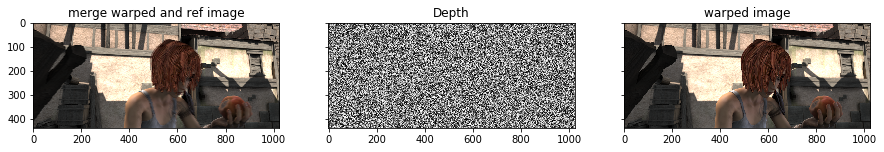

Train iteration: 1000/50000	Loss: 0.019517


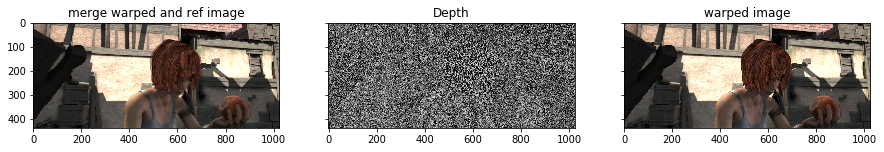

Train iteration: 2000/50000	Loss: 0.0177566


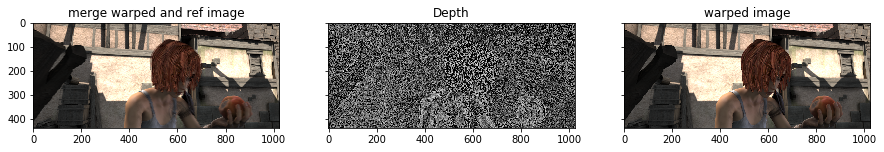

Train iteration: 3000/50000	Loss: 0.0166659


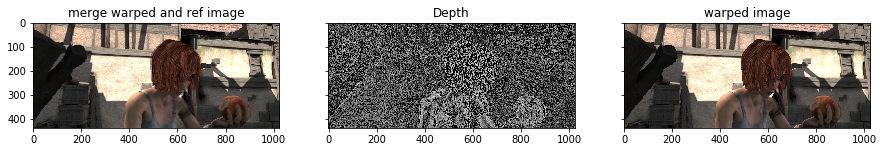

Train iteration: 4000/50000	Loss: 0.0158608


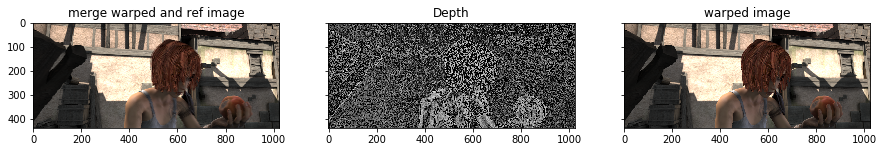

Train iteration: 5000/50000	Loss: 0.0152161


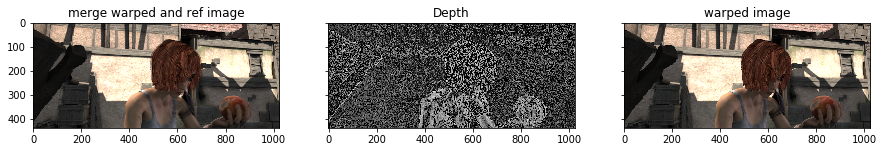

Train iteration: 6000/50000	Loss: 0.0146813


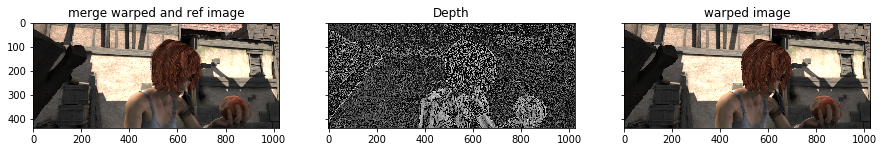

Train iteration: 7000/50000	Loss: 0.0142284


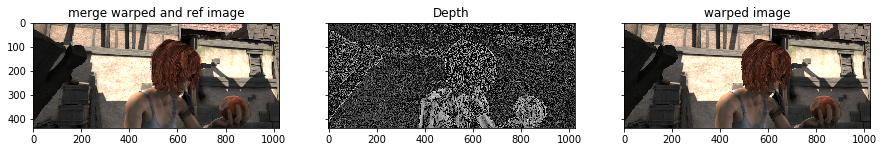

Train iteration: 8000/50000	Loss: 0.0138468


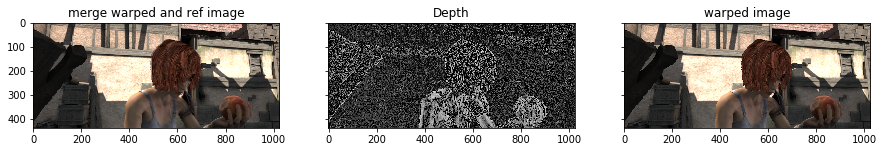

Train iteration: 9000/50000	Loss: 0.0135462


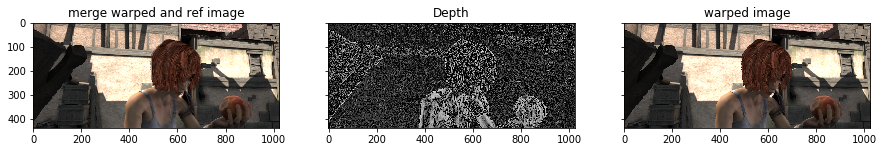

Train iteration: 10000/50000	Loss: 0.0133012


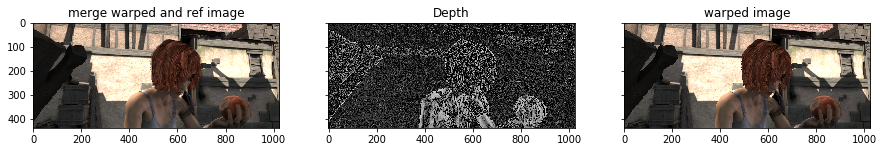

Train iteration: 11000/50000	Loss: 0.0130861


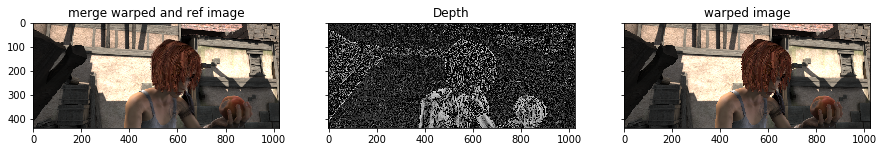

Train iteration: 12000/50000	Loss: 0.0128905


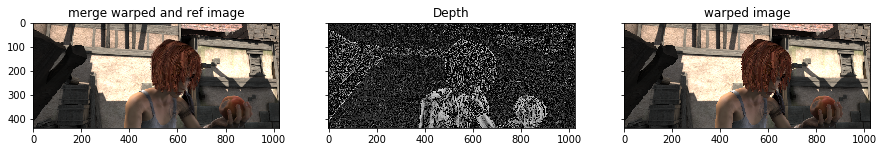

Train iteration: 13000/50000	Loss: 0.012715


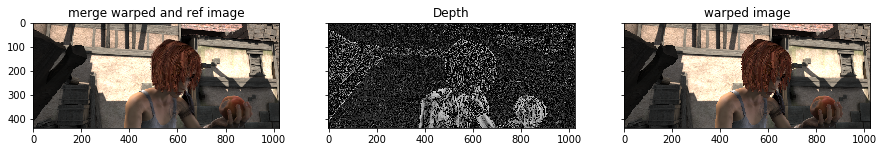

Train iteration: 14000/50000	Loss: 0.0125616


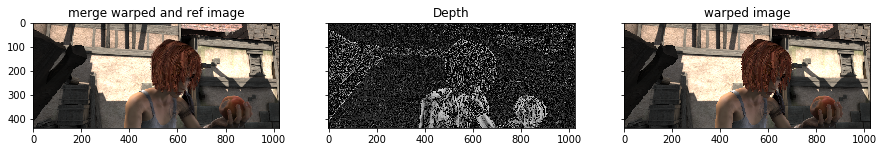

Train iteration: 15000/50000	Loss: 0.0124294


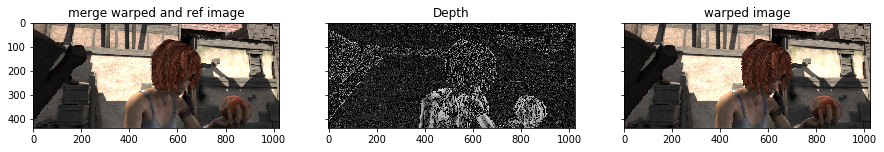

Train iteration: 16000/50000	Loss: 0.0123121


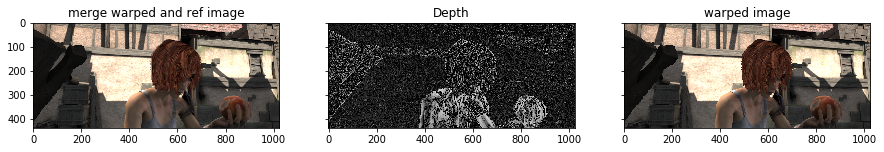

Train iteration: 17000/50000	Loss: 0.0122079


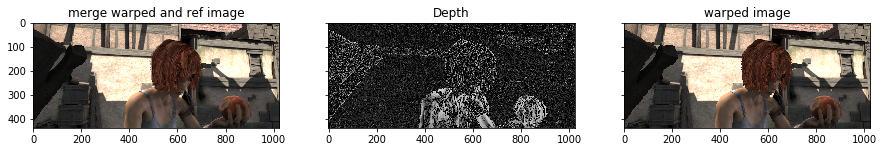

Train iteration: 18000/50000	Loss: 0.0121145


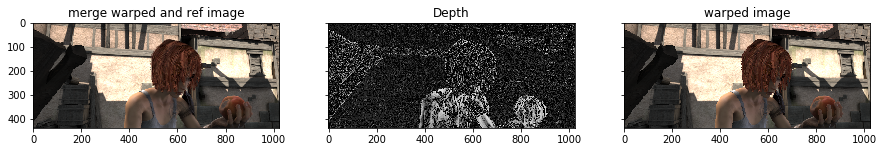

Train iteration: 19000/50000	Loss: 0.0120331


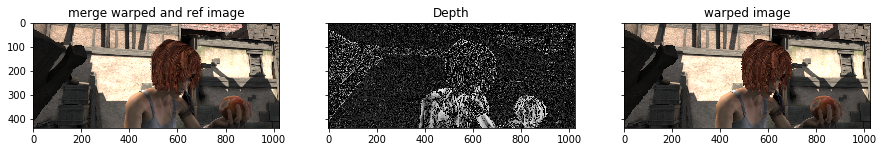

Train iteration: 20000/50000	Loss: 0.011963


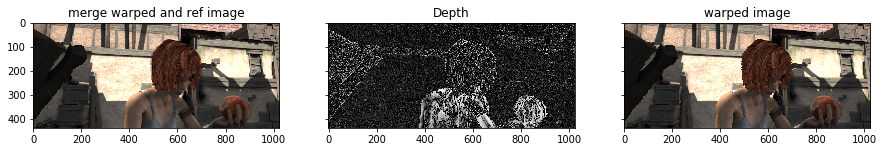

Train iteration: 21000/50000	Loss: 0.0119045


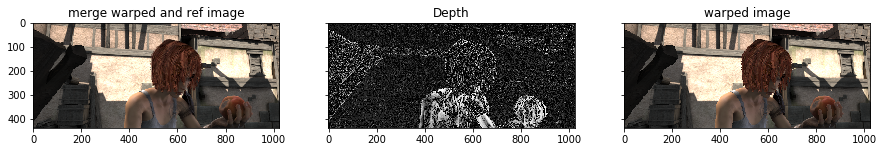

Train iteration: 22000/50000	Loss: 0.0118574


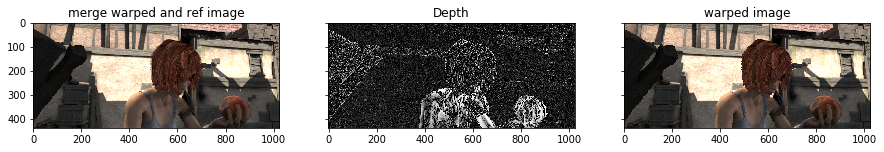

Train iteration: 23000/50000	Loss: 0.0118208


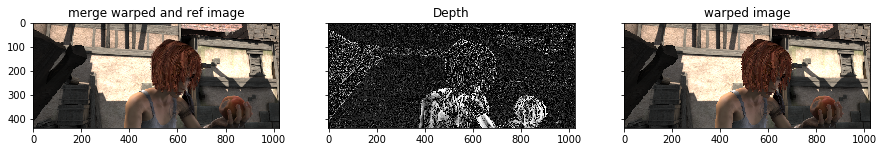

Train iteration: 24000/50000	Loss: 0.0117917


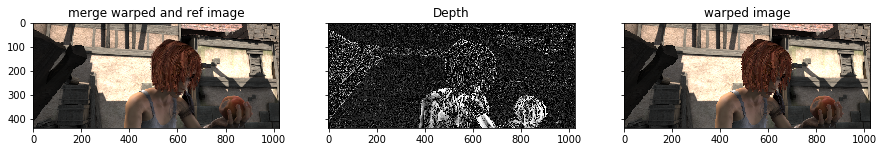

Train iteration: 25000/50000	Loss: 0.0117682


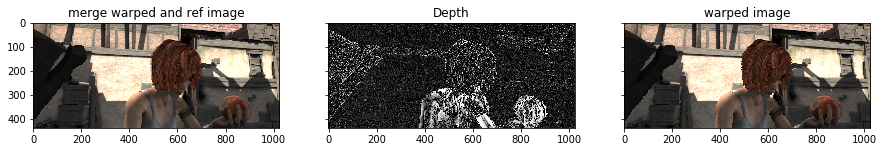

Train iteration: 26000/50000	Loss: 0.0117499


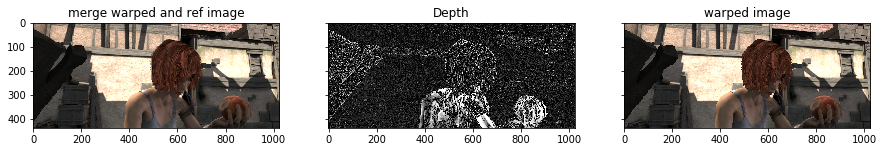

Train iteration: 27000/50000	Loss: 0.0117352


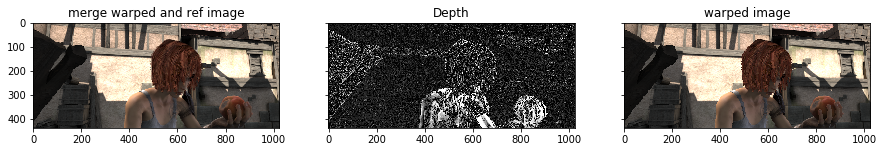

Train iteration: 28000/50000	Loss: 0.011723


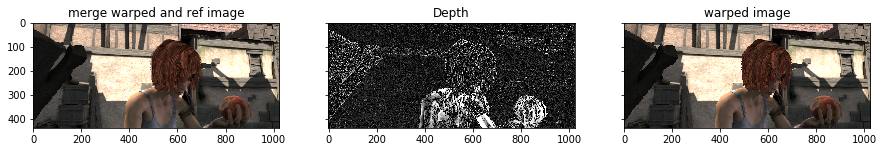

Train iteration: 29000/50000	Loss: 0.011713


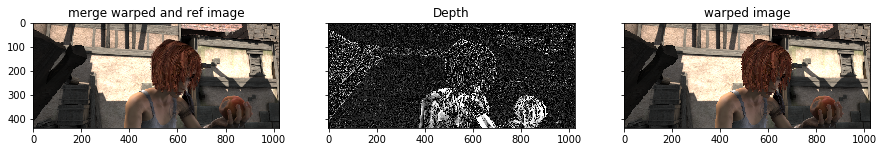

Train iteration: 30000/50000	Loss: 0.0117048


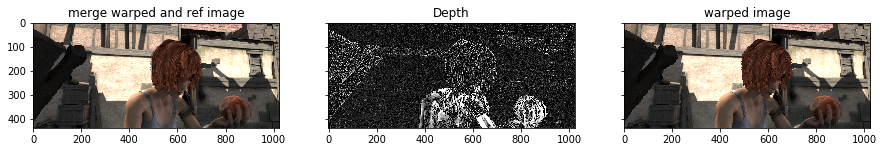

Train iteration: 31000/50000	Loss: 0.0116976


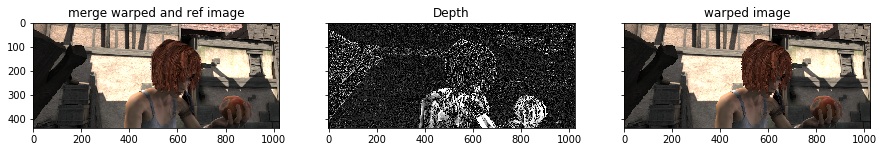

Train iteration: 32000/50000	Loss: 0.0116918


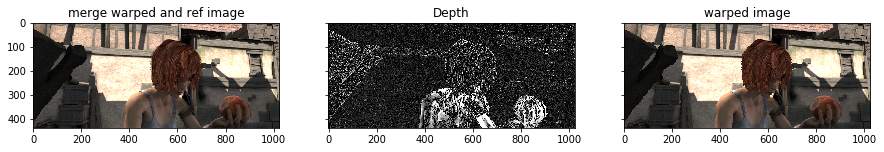

Train iteration: 33000/50000	Loss: 0.0116868


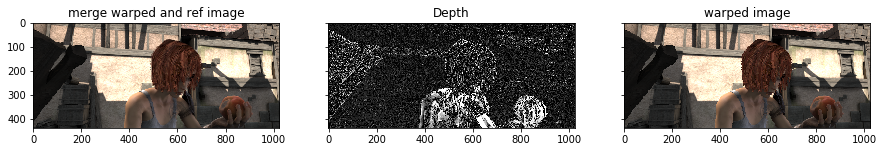

Train iteration: 34000/50000	Loss: 0.0116822


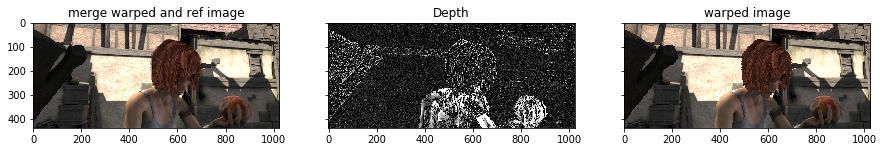

Train iteration: 35000/50000	Loss: 0.0116778


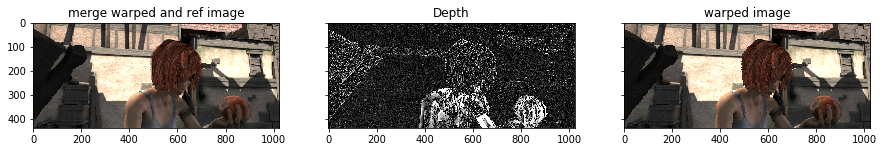

Train iteration: 36000/50000	Loss: 0.0116738


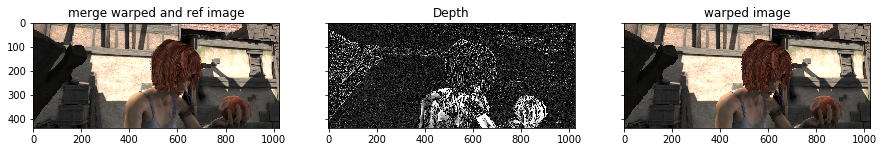

Train iteration: 37000/50000	Loss: 0.0116703


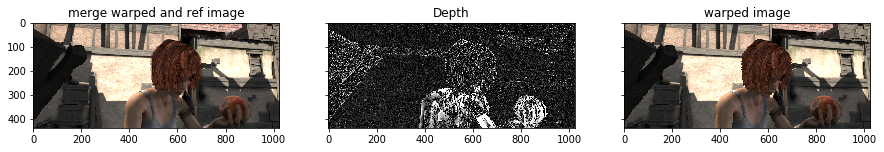

Train iteration: 38000/50000	Loss: 0.0116671


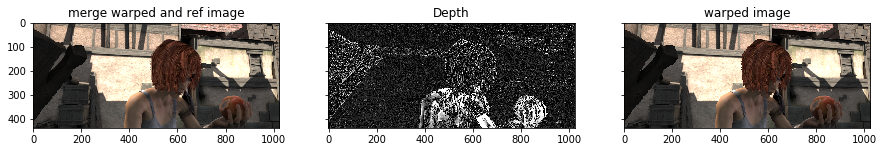

Train iteration: 39000/50000	Loss: 0.0116641


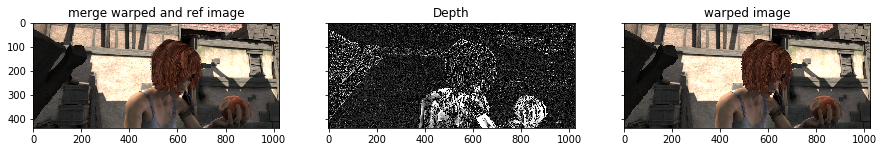

Train iteration: 40000/50000	Loss: 0.0116615


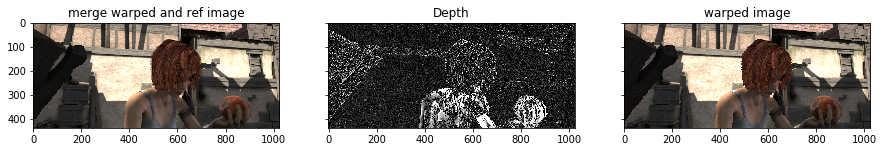

Train iteration: 41000/50000	Loss: 0.0116591


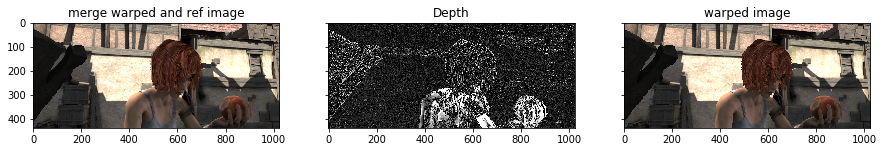

Train iteration: 42000/50000	Loss: 0.0116569


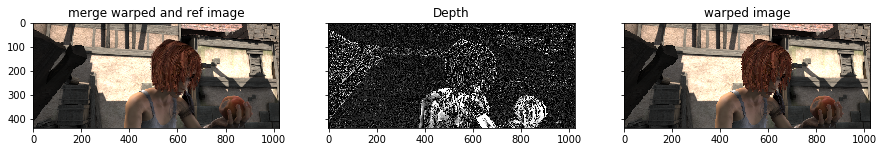

Train iteration: 43000/50000	Loss: 0.0116549


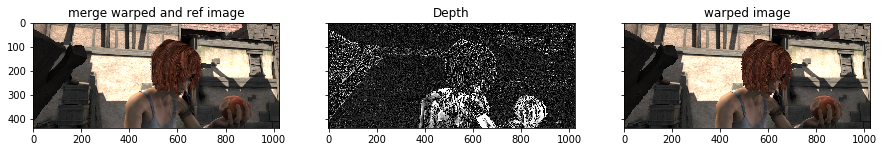

Train iteration: 44000/50000	Loss: 0.0116529


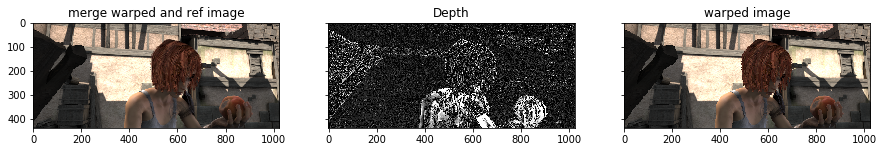

Train iteration: 45000/50000	Loss: 0.0116512


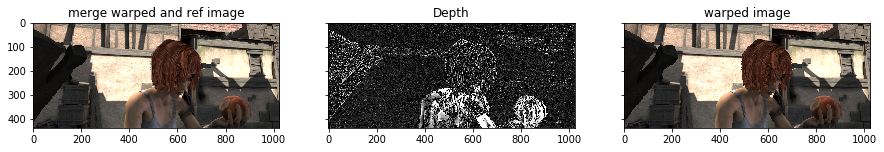

Train iteration: 46000/50000	Loss: 0.0116494


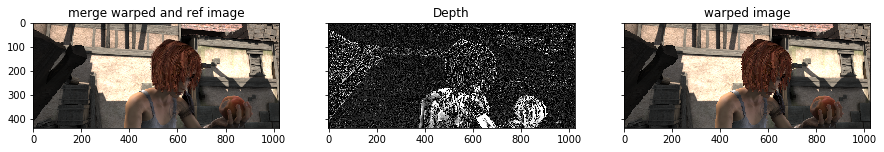

Train iteration: 47000/50000	Loss: 0.0116477


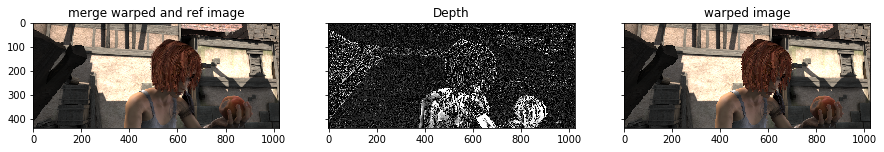

Train iteration: 48000/50000	Loss: 0.0116462


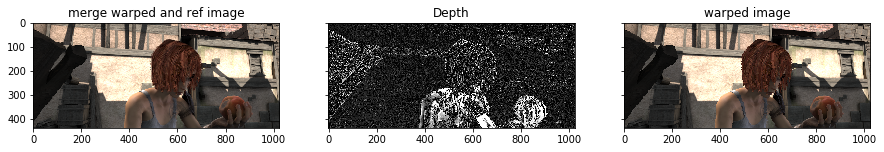

Train iteration: 49000/50000	Loss: 0.0116448


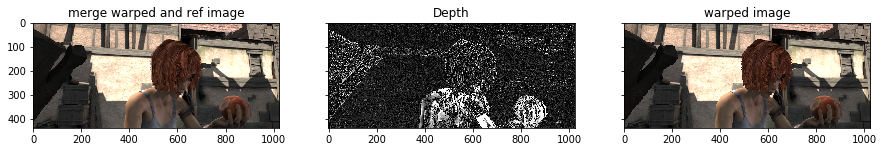

Train iteration: 49999/50000	Loss: 0.0116434


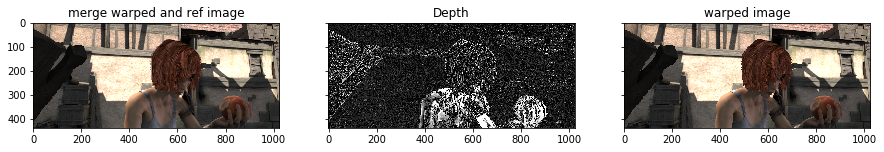

In [10]:
for iter_idx in range(num_iterations):

    # compute the inverse depth and warp the source image                                                                                
    img_i_to_ref = warper(inv_depth_ref(), img_i)

    # compute the photometric loss
    loss = F.l1_loss(img_i_to_ref, img_ref, reduction='none')

    # propagate the error just for a fixed window
    w_size = 100  # window size
    h_2, w_2 = height // 2, width // 2
    #loss = loss[..., h_2 - w_size:h_2 + w_size, w_2 - w_size:w_2 + w_size]
    loss = torch.mean(loss)

    # compute gradient and update optimizer parameters
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if iter_idx % log_interval == 0 or iter_idx == num_iterations-1:
        print('Train iteration: {}/{}\tLoss: {:.6}'.format(
        iter_idx, num_iterations, loss.item()))
        # merge warped and target image for visualization                                                                                
        img_i_to_ref = warper(inv_depth_ref(), img_i)
        
        img_vis = 0.5 * (img_i_to_ref + img_ref)
           
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True)
        fig.set_figheight(15); fig.set_figwidth(15)
        ax1.imshow(clip_and_convert_tensor(img_vis))
        ax1.set_title('merge warped and ref image')
        
        ax3.imshow(clip_and_convert_tensor(img_i_to_ref))        
        ax3.set_title('warped image')
        est_depth_t = inv_depth_ref()
        est_depth_t = est_depth_t / (est_depth_t.max() + EPS)

        est_depth = tgm.utils.tensor_to_image(est_depth_t).squeeze()
        est_depth = np.clip(est_depth*255., 0, 255)
        est_depth = est_depth.astype('uint8')
        ax2.imshow(est_depth, cmap='gray')
        ax2.set_title('Depth')
        plt.show()

In [11]:
# generate occlusion mask                                                                                                            
mask = ((img_ref - img_i_to_ref).mean(1) < 1e-1).float()

img_vis_warped = 0.5 * (img_i_to_ref + img_ref)
img_vis_warped_masked = mask * 0.5 * (img_i_to_ref + img_ref)

### Visualize the outputs

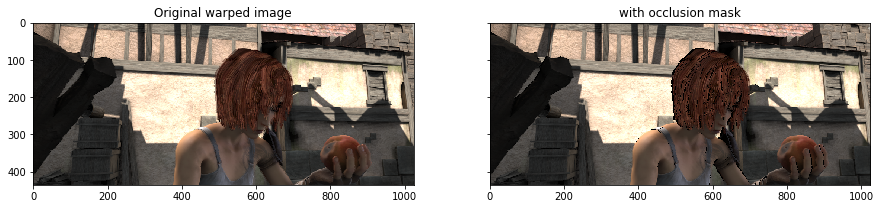

In [12]:
fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
fig.set_figheight(15)
fig.set_figwidth(15)
ax1.imshow(clip_and_convert_tensor(img_vis_warped))
ax1.set_title('Original warped image')
ax2.imshow(clip_and_convert_tensor(img_vis_warped_masked))
ax2.set_title('with occlusion mask')
plt.show()